# Assignment Module 2: Product Classification

The goal of this assignment is to implement a neural network that classifies smartphone pictures of products found in grocery stores. The assignment will be divided into two parts: first, you will be asked to implement from scratch your own neural network for image classification; then, you will fine-tune a pretrained network provided by PyTorch.


## Preliminaries: the dataset
The dataset you will be using contains natural images of products taken with a smartphone camera in different grocery stores:

<p align="center">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Granny-Smith.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Pink-Lady.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Lemon.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Banana.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Vine-Tomato.jpg" width="150">
</p>
<p align="center">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Yellow-Onion.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Green-Bell-Pepper.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Arla-Standard-Milk.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Oatly-Natural-Oatghurt.jpg" width="150">
  <img src="https://github.com/marcusklasson/GroceryStoreDataset/raw/master/sample_images/natural/Alpro-Fresh-Soy-Milk.jpg" width="150">
</p>

The products belong to the following 43 classes:
```
0.  Apple
1.  Avocado
2.  Banana
3.  Kiwi
4.  Lemon
5.  Lime
6.  Mango
7.  Melon
8.  Nectarine
9.  Orange
10. Papaya
11. Passion-Fruit
12. Peach
13. Pear
14. Pineapple
15. Plum
16. Pomegranate
17. Red-Grapefruit
18. Satsumas
19. Juice
20. Milk
21. Oatghurt
22. Oat-Milk
23. Sour-Cream
24. Sour-Milk
25. Soyghurt
26. Soy-Milk
27. Yoghurt
28. Asparagus
29. Aubergine
30. Cabbage
31. Carrots
32. Cucumber
33. Garlic
34. Ginger
35. Leek
36. Mushroom
37. Onion
38. Pepper
39. Potato
40. Red-Beet
41. Tomato
42. Zucchini
```

The dataset is split into training (`train`), validation (`val`), and test (`test`) set.

The following code cells download the dataset and define a `torch.utils.data.Dataset` class to access it. This `Dataset` class will be the starting point of your assignment: use it in your own code and build everything else around it.

In [236]:
!rm -rf ./GroceryStoreDataset
!git clone https://github.com/marcusklasson/GroceryStoreDataset.git

'rm' is not recognized as an internal or external command,
operable program or batch file.
fatal: destination path 'GroceryStoreDataset' already exists and is not an empty directory.


In [237]:
from pathlib import Path
from PIL import Image, ImageOps
from torch import Tensor
from torch.utils.data import Dataset, DataLoader, ConcatDataset, Subset
from typing import List, Tuple
from torch import nn
from matplotlib import pyplot as plt
import numpy as np
import random
import torch
import os
import pandas as pd
from torchvision.transforms.functional import to_tensor
import torchvision.transforms as transforms
from torchvision.models import resnet18

In [238]:
class GroceryStoreDataset(Dataset):

    def __init__(self, split: str, transform=None) -> None:
        super().__init__()

        self.root = Path("GroceryStoreDataset/dataset")
        self.split = split
        self.paths, self.labels = self.read_file()

        self.transform = transform

    def __len__(self) -> int:
        return len(self.labels)

    def __getitem__(self, idx) -> Tuple[Tensor, int]:
        img = Image.open(self.root / self.paths[idx])
        label = self.labels[idx]

        if self.transform:
            img = self.transform(img)

        return img, label

    def read_file(self) -> Tuple[List[str], List[int]]:
        paths = []
        labels = []

        with open(self.root / f"{self.split}.txt") as f:
            for line in f:
                # path, fine-grained class, coarse-grained class
                path, _, label = line.replace("\n", "").split(", ")
                paths.append(path), labels.append(int(label))

        return paths, labels

    def get_num_classes(self) -> int:
        return max(self.labels) + 1

## Part 1: design your own network

Your goal is to implement a convolutional neural network for image classification and train it on `GroceryStoreDataset`. You should consider yourselves satisfied once you obtain a classification accuracy on the **validation** split of **around 60%**. You are free to achieve that however you want, except for a few rules you must follow:

- You **cannot** simply instantiate an off-the-self PyTorch network. Instead, you must construct your network as a composition of existing PyTorch layers. In more concrete terms, you can use e.g. `torch.nn.Linear`, but you **cannot** use e.g. `torchvision.models.alexnet`.

- Justify every *design choice* you make. Design choices include network architecture, training hyperparameters, and, possibly, dataset preprocessing steps. You can either (i) start from the simplest convolutional network you can think of and add complexity one step at a time, while showing how each step gets you closer to the target ~60%, or (ii) start from a model that is already able to achieve the desired accuracy and show how, by removing some of its components, its performance drops (i.e. an *ablation study*). You can *show* your results/improvements however you want: training plots, console-printed values or tables, or whatever else your heart desires: the clearer, the better.

Don't be too concerned with your network performance: the ~60% is just to give you an idea of when to stop. Keep in mind that a thoroughly justified model with lower accuracy will be rewarded **more** points than a poorly experimentally validated model with higher accuracy.

## Part 2: fine-tune an existing network

Your goal is to fine-tune a pretrained **ResNet-18** model on `GroceryStoreDataset`. Use the implementation provided by PyTorch, do not implement it yourselves! (i.e. exactly what you **could not** do in the first part of the assignment). Specifically, you must use the PyTorch ResNet-18 model pretrained on ImageNet-1K (V1). Divide your fine-tuning into two parts:

1. First, fine-tune the Resnet-18 with the same training hyperparameters you used for your best model in the first part of the assignment.
1. Then, tweak the training hyperparameters in order to increase the accuracy on the validation split of `GroceryStoreDataset`. Justify your choices by analyzing the training plots and/or citing sources that guided you in your decisions (papers, blog posts, YouTube videos, or whatever else you find enlightening). You should consider yourselves satisfied once you obtain a classification accuracy on the **validation** split **between 80 and 90%**.

----

# Solution

## Part 01

### Setup

We fix a random seed to ensure full notebook reproducibility and also set up the utilization of the GPU, ensuring full support also for MacOS M1+ devices

We also download and import here any additional libraries we use

In [239]:
!pip install torchinfo


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [240]:
from torchinfo import summary
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
from tqdm.notebook import tqdm
import seaborn as sns
import pandas as pd

In [241]:
def fix_random(seed: int) -> None:
    """
        Fix all the possible sources of randomness.

        @param seed: the seed to use
    """
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

fix_random(42)

In [242]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu") # Run locally also on MacOS M1+ devices

print(f'Available device: {device}')

Available device: cuda


### Data Pre-Processing

The first step is to examine our dataset to inspect image properties. With this step, we establish our desired format and how to make the images compliant to that

In [243]:
def get_dataset_stats(image_array):
    sizes = []
    for el in image_array:
        sizes.append(el[0].size)
    widths, heights = zip(*sizes)

    stats = {
        'min_width': np.min(widths),
        'max_width': np.max(widths),
        'mean_width': np.mean(widths),
        'std_width': np.std(widths),
        'min_height': np.min(heights),
        'max_height': np.max(heights),
        'mean_height': np.mean(heights),
        'std_height': np.std(heights),
    }
    return stats

In [244]:
data = GroceryStoreDataset(split="train")
df_stats = get_dataset_stats(data)
pd.DataFrame.from_dict(df_stats, orient='index')

,0
min_width,348.000000
max_width,464.000000
mean_width,348.746970
std_width,9.278498
min_height,348.000000
max_height,464.000000
mean_height,353.536364
std_height,24.729878


### Apply Padding to the images

In order to have images of our desired size (224x224), we apply a zero padding (expand the image up to the target size with black border).

This choice allows us to maintain a uniform input size, while not altering any activations (bias excluded), therefore not influencing final results

In [245]:
def create_transforms(output_size):
    def zero_padding(image):
        return to_tensor(ImageOps.pad(image, output_size))
    return zero_padding

In [246]:
IMG_SIZE = 224
try_preprocessing = GroceryStoreDataset(split="train", transform = create_transforms((IMG_SIZE, IMG_SIZE)))

The final result is the following:

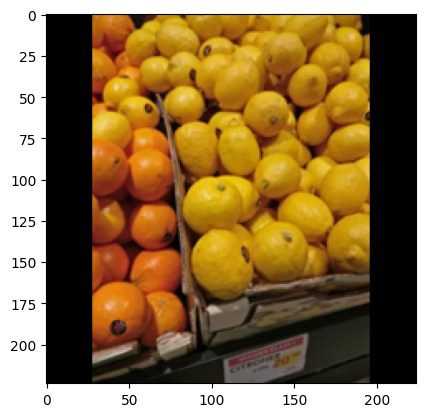

In [247]:
plt.imshow(try_preprocessing[430][0].permute(1,2,0));

In [248]:
# This will be a useful constant later on

NUM_CLASSES = data.get_num_classes()

### Data Splits, Training and Evaluation Loops

In this section, we extract the data splits from the given function, applying the transformation proposed in the previous section.

Furthermore, we write the training and evaluation loop, which we will use in the following parts (both for 01 and 02), and utility functions for result visualization

In [249]:
train_data = GroceryStoreDataset(split="train", transform = create_transforms((IMG_SIZE, IMG_SIZE)))
val_data = GroceryStoreDataset(split="val", transform = create_transforms((IMG_SIZE, IMG_SIZE)))
test_data = GroceryStoreDataset(split="test", transform = create_transforms((IMG_SIZE, IMG_SIZE)))

In [250]:
def train_loop(dataloader, model, loss_fn, optimizer, batch_size, device):
    """
        Handles the single train epoch step

        @param dataloader: input data to the network
        @param model: architecture to train
        @param loss_fn: identified loss function
        @param optimizer: identified optimizer
        @param batch_size: identified batch_size
        @param device: device on which the model runs (can be either "cpu", "cuda" or "mps")
    """
    size = len(dataloader.dataset)

    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.train()

    progress_bar = tqdm(dataloader, desc="Training Batch", position=1, leave=False, disable=False, dynamic_ncols=True)

    for batch, (X, y) in enumerate(progress_bar):
        # Move data to device
        X = X.to(device)
        y = y.to(device)
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # set gradient to zero to avoid gradient accumulation
        optimizer.zero_grad()

        # Backpropagation
        loss.backward()
        optimizer.step()

        loss_val = loss.item()

        progress_bar.set_postfix(loss=loss_val, refresh=True)

        # if (batch + 1) % 40 == 0:
        #     loss, current = loss_val, batch * batch_size + len(X)
        #     tqdm.write(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

In [251]:
def test_loop(dataloader, model, loss_fn, device, validation:bool=False):
    """
        Computes Metrics on the test set on all samples

        @param dataloader: input data to the network
        @param model: architecture to train
        @param loss_fn: identified loss function
        @param device: device on which the model runs (can be either "cpu", "cuda" or "mps")
        @param validation: distinguish between validation and test (default False)
    """
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    all_preds = []
    all_labels = []

    progress_bar = tqdm(dataloader, desc="Evaluate Batch", position=1, leave=False, disable=False, dynamic_ncols=True)

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for batch, (X, y)in enumerate(progress_bar):
            # Move data to device
            X = X.to(device)
            y = y.to(device)
            pred = model(X)
            loss_val = loss_fn(pred, y).item()
            test_loss += loss_val
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

            all_preds.extend(pred.argmax(1).cpu().numpy())
            all_labels.extend(y.cpu().numpy())
            progress_bar.set_postfix(loss=loss_val, refresh=True)

    test_loss /= num_batches
    correct /= size

    # print(f"{'Validation' if validation else 'Test'} Error:\nAccuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")
    # tqdm.write(f"{'Validation' if validation else 'Test'} Error:\nAccuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")

    # Compute Metrics
    precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='macro', zero_division=0)
    confusion = confusion_matrix(all_labels, all_preds)

    metrics_dict = {
        "accuracy" : correct,
        "precision" : precision,
        "recall" : recall,
        "f1_score" : f1,
        "confusion_matrix" : confusion
    }

    return test_loss, metrics_dict

In [252]:
def train(dataloaders, loss_fn, optimizer, model, model_name, batch_size, epochs, loss_thresh=2.5, force_train=True, early_stopping: int=10):
    """
        Training Function

        @param dataloaders: tuple containing dataloaders for all splits (train, val, test)
        @param loss_fn: intended loss function
        @param optimizer: intended optimizer
        @param model: model to evaluate
        @param model_name: name of the model
        @param batch_size: intended batch size
        @param epochs: number of training epochs
        @param loss_thresh: use it to save only the best model weights found(default: 2.5)
        @param force_train: force the network to train if weights do not exist or overwrites previous training (default: True)
        @param early_stopping: amount of epochs after which, if no improvement has been found, training stops to avoid overfitting (default: 10)
    """
    train_dataloader, val_dataloader, _ = dataloaders # This function does not make use of test data
    weight_filename = f"best_{model_name}.pth"
    # trains only if filename exists
    losses = []
    if not os.path.isfile(weight_filename) or force_train:
        counter = 0
        best_loss = float('inf')
        if os.path.isfile(weight_filename):
            model.load_state_dict(torch.load(weight_filename, weights_only=True))
            best_loss, _ = test_loop(val_dataloader, model, loss_fn, device, validation=True)
        with tqdm(range(epochs), desc="Training Progress", position=0, leave=False, dynamic_ncols=True) as progress_bar:
            for t in progress_bar:
                # print(f"Epoch {t+1}/{epochs}\n-------------------------------")
                train_loop(train_dataloader, model, loss_fn, optimizer, batch_size, device)
                curr_loss, m_d = test_loop(val_dataloader, model, loss_fn, device, validation=True)
                counter += 1
                if curr_loss < best_loss:
                    best_loss = curr_loss
                    counter = 0
                    #tqdm.write('new best model found')
                    #print('new best model found')
                    if best_loss < loss_thresh:
                        torch.save(model.state_dict(), weight_filename)
                        #print('best model saved')
                        #tqdm.write('new best model saved')
                losses.append(curr_loss)
                if counter > early_stopping:
                    break
                progress_bar.set_postfix(val_loss=curr_loss, val_acc=m_d["accuracy"], refresh=True)

    model.load_state_dict(torch.load(weight_filename, weights_only=True))
    if losses != []:
        return losses

In [313]:
def compare_metrics(model_metrics):
    """
        Plot accuracy, precision, recall and F1-Score for all the networks

        @param model_metrics: dictionary containing metrics for multiple models
    """

    data = []
    for model_name, metrics in model_metrics.items():
        for metric, value in metrics.items():
            if "confusion" not in metric:
                data.append({"Model": model_name, "Metric": metric, "Value": value})

    df = pd.DataFrame(data)
    print(df.head())
    plt.figure(figsize=(10,6))

    sns.barplot(x='Metric', y='Value', hue='Model', data=df, palette='coolwarm')
    plt.ylim(0,1)
    plt.xlabel("Metrics")
    plt.ylabel("Scores")
    plt.title("Model Comparison based on Performance Metrics")
    plt.legend(title="Models")

In [254]:
def plot_training_behavior(losses=None, model_name="model"):
    """
        Plot loss during training to visualize network behavior

        @param losses: list containing loss during each epoch
    """

    if losses != None:
        plt.plot(losses)
        plt.title(f"Validation loss over epochs for {model_name}")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.show();

In [255]:
def plot_all_training_behaviors(dict_losses):
    """
        Plot loss during training for all networks

        @param dict_losses: dictionary containing loss for all networks
    """
    df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in dict_losses.items()]))

    sns.lineplot(data=df, palette='coolwarm')
    plt.title("Comparison of validation loss over epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend(title="Models")
    plt.show();


In [256]:
model_metrics = {}
model_training_behavior = {}

### Base Model: Simple CNN

We begin with a simple, fairly small Convolutional Neural Network for classification, inspired from common practices in image classification.

It begins with a series of three Convolutional Layers, with increasing output channel size, and small kernels (5x5 and two 3x3).
Then, we have a Fully Connected Classification Head, with two linear layers, that outputs the chosen class.

We choose ReLU as our non-linear activation function, following best practices to counter vanishing gradients.

In [257]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        # aka stem layer
        self.conv_stack = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=5, stride=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )
        self.flatten = nn.Flatten()
        self.class_head = nn.Sequential(
            nn.Linear(in_features=92416, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512,out_features=43),
        )

    def forward(self, x):
        convolved = self.conv_stack(x)
        flattened = self.flatten(convolved)

        classification = self.class_head(flattened)
        return classification

Training parameters are chosen empirically for the SimpleCNN after some preliminary testing on reasonable configurations.  Where possible, we left them unchanged in the subsequent networks to better isolate the improvements we obtained with architectural changes alone. 

In [258]:
# Hyperparameters for SimpleCNN (Chosen Empirically)
LEARNING_RATE = 3e-4
EPOCHS = 100
BATCH_SIZE = 16

In [259]:
model = SimpleCNN().to(device)

#summary(model, input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE), verbose=0)
model

SimpleCNN(
  (conv_stack): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(3, 3), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): ReLU()
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (class_head): Sequential(
    (0): Linear(in_features=92416, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=43, bias=True)
  )
)

We wanted to start with a barebones architecture, hence we decided to use some basic tools for loss and stepping function.

For this reason we chose the **Cross-Entropy Loss**, as it is customary for Classification Networks and Stochastic Gradient Descent (**SGD**) as optimizer.

In [260]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE)

In [261]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

In [262]:
loaders = (train_dataloader, val_dataloader, test_dataloader)
simplecnn_trainingBehavior = train(loaders, loss_fn, optimizer, model, "CNN_simple", batch_size=BATCH_SIZE, epochs=EPOCHS, loss_thresh=3.7, force_train=True)
loss, metrics_dict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

In [263]:
model_metrics['SimpleCNN'] = metrics_dict
model_training_behavior['SimpleCNN'] = simplecnn_trainingBehavior

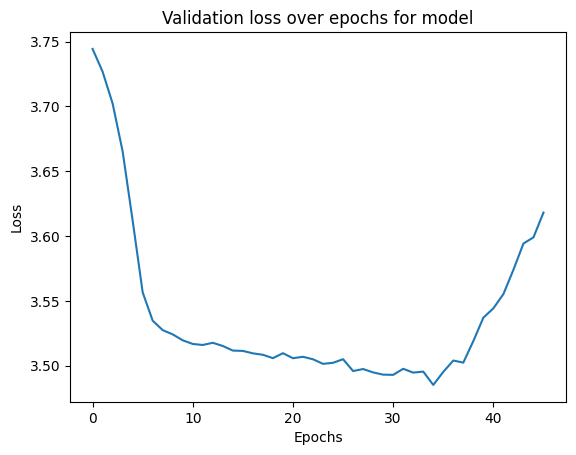

In [264]:
plot_training_behavior(simplecnn_trainingBehavior)

In [265]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

In [266]:
print(f'Accuracy of the SimpleCNN model on test dataset: {round(model_metrics["SimpleCNN"]["accuracy"]*100, 1)}%')

Accuracy of the SimpleCNN model on test dataset: 15.5%


#### Results:
As we expected, the model performs poorly. The hypothesis is that the network is not sufficiently deep to capture the necessary features for detection.

### Improvement 01: Stem CNN

The obvious next step following previous findings would be to make the network deeper, as more non-linearities generally improve a Deep Neural Network (DNN) performance. However, in its current state, the SimpleCNN has too many weights; it would be too time and computation-wise straining to train in our setup.

Thus, we introduce a **Stem Layer**, inspired to the one in Inception v1, to reduce the width and height dimensionalities of the hidden activations, lowering the parameters required once the FC layers are reached, and maintaining roughly the same level of performance.

In [267]:
class StemCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.stem_layer = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2)
        )
        self.conv_stack = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5, stride=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )
        self.flatten = nn.Flatten()
        self.class_head = nn.Sequential(
            nn.Linear(in_features=12800, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512,out_features=43),
        )

    def forward(self, x):
        stemmed = self.stem_layer(x)
        convolved = self.conv_stack(stemmed)
        flattened = self.flatten(convolved)

        classification = self.class_head(flattened)
        return classification

For continuity we decided not to modify hyperparameters, loss function or anything else when introducing changes in the architecture.

In [268]:
LEARNING_RATE = 3e-4
EPOCHS = 100
BATCH_SIZE = 16

In [269]:
model = StemCNN().to(device)
model

StemCNN(
  (stem_layer): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_stack): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(3, 3), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): ReLU()
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (class_head): Sequential(
    (0): Linear(in_features=12800, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=43, bias=True)
  )
)

In [270]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE)

In [271]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

In [272]:
loaders = (train_dataloader, val_dataloader, test_dataloader)
stemcnn_trainingBehavior = train(loaders, loss_fn, optimizer, model, "CNN_stem", batch_size=BATCH_SIZE, epochs=EPOCHS, loss_thresh=3.7, force_train=True)
loss, metrics_dict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

In [273]:
model_metrics['StemCNN'] = metrics_dict
model_training_behavior['StemCNN'] = stemcnn_trainingBehavior

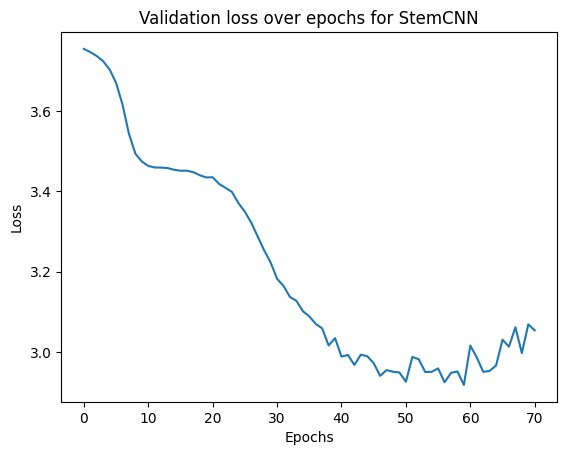

In [274]:
plot_training_behavior(stemcnn_trainingBehavior, model_name="StemCNN")

In [275]:
print(f'Accuracy of the StemCNN model on test dataset: {round(model_metrics["StemCNN"]["accuracy"]*100, 1)}%')

Accuracy of the StemCNN model on test dataset: 29.5%


#### Results:
We observed a _performance improvement_ following Stem Layer introduction, as we can see from the final value of accuracy and the Validation Loss graph.

This while obtaining a _6-fold reduction_ in the size of the weights (going from ~182MB to just ~32MB).

In [276]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

-----

### Improvement 02: Adam optimizer

Training the StemCNN takes more time than we are comfortable with in a time and resource-constrained setting. To ease this issue we have two options: we can either increase the amount of epochs (for future models) or change the optimizer used.

Due to our resource constraint (being able to run in the free Google Colab tier for full reproducibility), we opted for the second option.

Another widely used optimizer and _de facto_ standard in many DNNs for various tasks is **ADAM** (Kingma & Ba, 2015), a derivative of AdaGrad with Momentum. Its adaptive nature, i.e. it computes individual learning rates for different parameters, allows for higher learning rates when needed and should lead to faster convergence in our setting.

In [277]:
model = StemCNN().to(device)
model

StemCNN(
  (stem_layer): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_stack): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(3, 3), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): ReLU()
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (class_head): Sequential(
    (0): Linear(in_features=12800, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=43, bias=True)
  )
)

Learning rate has been lowered with respect to the previous two networks since Adam does not need as high of a learning rate as SGD and we do not want a too fast convergence.

In [278]:
LEARNING_RATE = 1e-5
EPOCHS = 100
BATCH_SIZE = 16

In [279]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [280]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

In [281]:
loaders = (train_dataloader, val_dataloader, test_dataloader)
adamcnn_trainingBehavior = train(loaders, loss_fn, optimizer, model, "CNN_adam", batch_size=BATCH_SIZE, epochs=EPOCHS, loss_thresh=3.7, force_train=True)
loss, metrics_dict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

In [282]:
model_metrics['AdamCNN'] = metrics_dict
model_training_behavior['AdamCNN'] = adamcnn_trainingBehavior

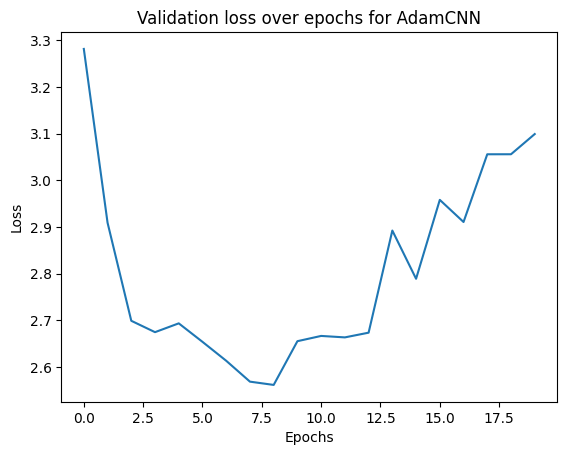

In [283]:
plot_training_behavior(adamcnn_trainingBehavior, model_name="AdamCNN")

In [284]:
print(f'Accuracy of the StemCNN model with Adam optimizer on test dataset: {round(model_metrics["AdamCNN"]["accuracy"]*100, 1)}%')

Accuracy of the StemCNN model with Adam optimizer on test dataset: 35.3%


#### Results:
We achieve the desired training speed, as we expected, and we increase accuracy with respect to StemCNN, in just ~10 epochs (if we exclude the overfitting section we can observe in the Validation Loss graph, due to a high patience in our Early Stopping setup).

In [285]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

-----

### Improvement 03: Complex CNN

Now, as initially mentioned, we continue by introducing **depth** into the network.

Inspired by VGG (Simonyan & Zisserman, 2014), we introduce depth in a structured way, by replicating the concept of **stages** (series of similar layers repeated in the network). Each stage is formed by two Convolutional layers and two ReLU activations.

After some preliminary tests, we also introduced **Batch Normalization** (Ioffe & Szegedy, 2015) at the end of each stage, since it better supports the addition of depth, as we have seen with ResNet. Batch Normalization enables easier backpropagation, introducing regularization and addressing internal covariate shift, stabilizing training and contributing to prevent gradient explosion/vanishing.

In [286]:
class ComplexCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.stem_layer = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2)
        )
        self.conv_stack = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=64),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=128),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=256),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=512),
        )
        self.flatten = nn.Flatten()
        self.class_head = nn.Sequential(
            nn.Linear(in_features=8192, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=43),
        )

    def forward(self, x):
        stemmed = self.stem_layer(x)
        convolved = self.conv_stack(stemmed)
        flattened = self.flatten(convolved)
        classification = self.class_head(flattened)
        return classification

In [287]:
model = ComplexCNN().to(device)
model

ComplexCNN(
  (stem_layer): Sequential(
    (0): Conv2d(3, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_stack): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (3): ReLU()
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
    (8): ReLU()
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(256, 256, kernel_size=(1, 1), stride=(1

In [288]:
# Hyperparameters for ComplexCNN

LEARNING_RATE = 1e-5
EPOCHS = 100
BATCH_SIZE = 16

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [289]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

In [290]:
loaders = (train_dataloader, val_dataloader, test_dataloader)
complexCNN_trainingBehavior = train(loaders, loss_fn, optimizer, model, "CNN_complex", batch_size=BATCH_SIZE, epochs=EPOCHS, loss_thresh=3.5, force_train=True, early_stopping=10)
complexCNN_loss, complexCNN_metricsDict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

In [291]:
model_metrics["ComplexCNN"] = complexCNN_metricsDict
model_training_behavior["ComplexCNN"] = complexCNN_trainingBehavior

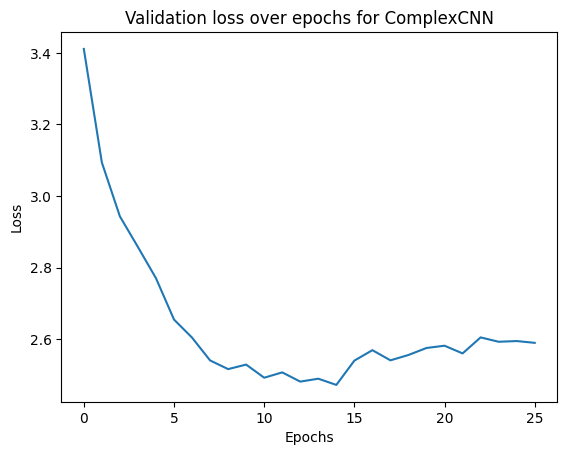

In [292]:
plot_training_behavior(complexCNN_trainingBehavior, model_name="ComplexCNN")

In [293]:
print(f'Accuracy of the ComplexCNN model on the test dataset: {round(model_metrics["ComplexCNN"]["accuracy"]*100, 1)}%')

Accuracy of the ComplexCNN model on the test dataset: 38.0%


#### Results:
We observe a slight, but well-received reduction in the Validation Loss, that yields a ~6% increase in accuracy with respect to the previous step.
We also observe that depth can only take you so far, therefore we need to introduce further architectural improvements.

In [294]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

-----

### Improvement 04: Full Transition to VGG-Style CNN

To begin our architecture improvement, we introduce the only thing left missing among the VGG-inspired innovations we exploited: the **Max Pooling layer**.

We introduce a Max Pooling Layer at the end of each second stage, allowing for a substantial reduction in the network size (Max Pooling halves vertical and horizontal sizes on each stage, with respect to the stage in the previous model), successfully improving both computational time and resource utilization.

Furthermore, the flattened activation of the stages has now size less that a tenth (1K) with respect to the previous model (16K), which means a reduced amount of parameters for the Fully Connected Head.

Introducing Max Pooling layer, we observe a significant increase in performance.

A note: while VGG network uses stride=1 for their 3x3 convolutions, we maintain stride=2, as seen in the previous steps, for continuity.

In [295]:
class VGG_style(nn.Module):
    def __init__(self):
        super().__init__()
        self.stem_layer = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2)
        )
        self.conv_stack = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=64),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.BatchNorm2d(num_features=128),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=256),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=1, stride=1, padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.BatchNorm2d(num_features=512),
        )
        self.flatten = nn.Flatten()
        self.class_head = nn.Sequential(
            nn.Linear(in_features=512, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512, out_features=43),
        )

    def forward(self, x):
        stemmed = self.stem_layer(x)
        convolved = self.conv_stack(stemmed)
        flattened = self.flatten(convolved)
        classification = self.class_head(flattened)
        return classification

In [296]:
model = VGG_style().to(device)
#summary(model, input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE), verbose=0)
model

VGG_style(
  (stem_layer): Sequential(
    (0): Conv2d(3, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_stack): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (3): ReLU()
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), paddi

We increase the LR for this network to speed up training, as we observed during testing that a LR of 1e-5 was too small.

In [297]:
LEARNING_RATE = 1e-4
EPOCHS = 100
BATCH_SIZE = 16

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [298]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

loaders = (train_dataloader, val_dataloader, test_dataloader)
VGG_styleCNN_trainingBehavior = train(loaders, loss_fn, optimizer, model, "VGGStyle", batch_size=BATCH_SIZE, epochs=EPOCHS, loss_thresh=3.0, force_train=True, early_stopping=10)
VGG_loss, VGG_metricsDict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

In [299]:
model_metrics["VGG_Style_Net"] = VGG_metricsDict
model_training_behavior["VGG_Style_Net"] = VGG_styleCNN_trainingBehavior

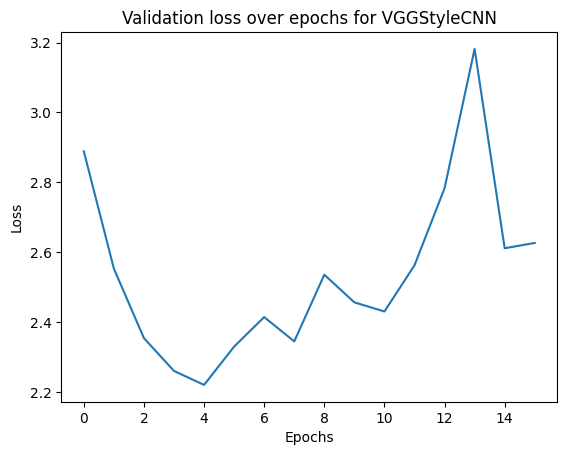

In [300]:
plot_training_behavior(VGG_styleCNN_trainingBehavior, model_name="VGGStyleCNN")

In [301]:
print(f'Accuracy of the VGGStyle model on the test dataset: {round(model_metrics["VGG_Style_Net"]["accuracy"]*100, 1)}%')

Accuracy of the VGGStyle model on the test dataset: 42.7%


#### Results:
With the addition of Max Pooling we simplify the network a bit, making it easier to train and more resilient to Overfitting.
Nonetheless we are still far from the required 60% accuracy, and need more improvements.

In [302]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

-----

### Improvement 05: ResLeNet

The final version of our network draws inspiration from ResNet (He et al., 2015) and GoogLeNet (Szegedy et al., 2014):
- We introduce **Residual Connections**, to ease training. For this reason we double the number of stages and match the same amount of Convolutional Layers we had in the ComplexCNN architecture; in addition, we set the stride to 1 for all Convolutional Layers
- We substitute the Fully Connected Classification Head with **Global Average Pooling**, drawing inspiration from GoogLeNet. This leads to a high reduction in weights for the last layers, while performance is preserved. This exploits the spatial invariance of Convolutional Layers (knowing the location of features is not important for classification, but the mere presence or absence has more relevance).

The final architectures halves the number of parameters, while achieving a substantial performance increase.

In [303]:
class ResLeNet_stage(nn.Module):
    def __init__(self, C_in, C_out):
        super().__init__()
        # Convolutional layers for non-residual connection
        self.conv_0 = nn.Sequential(
            nn.Conv2d(C_in, C_out, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
        )
        self.conv_1 = nn.Conv2d(C_out, C_out, kernel_size=1, stride=1, padding=0)
        # Convolutional layer for residual connection
        self.conv_2 = nn.Conv2d(C_in, C_out, kernel_size=1, stride=1, padding=0)

        # poolin layer for both type of connections
        self.pool_0 = nn.MaxPool2d(kernel_size=2)
        # batch normalization layer for non-residual connection
        self.batch_norm_0 = nn.BatchNorm2d(num_features=C_out)
        # batch normalization layer for residual connection
        self.batch_norm_1 = nn.BatchNorm2d(num_features=C_out)
        # ReLU activation function for sum of the two connections
        self.relu_0 = nn.ReLU()

    def forward(self, x):

        # non-residual side
        out = self.conv_0(x)
        out = self.conv_1(out)
        out = self.pool_0(out)
        out = self.batch_norm_0(out)

        # residual side
        res = self.conv_2(x)
        res = self.pool_0(res)
        res = self.batch_norm_1(res)

        # final output
        out = self.relu_0(out + res)
        return out


class ResLeNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.stem_layer = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2)
        )
        self.stage_0 = ResLeNet_stage(32, 64)
        self.stage_1 = ResLeNet_stage(64, 128)
        self.stage_2 = ResLeNet_stage(128, 256)
        self.stage_3 = ResLeNet_stage(256, 512)
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.flatten = nn.Flatten()
        self.linear_0 = nn.Linear(in_features=512, out_features=43)

    def forward(self, x):
        out = self.stem_layer(x)
        out = self.stage_0(out)
        out = self.stage_1(out)
        out = self.stage_2(out)
        out = self.stage_3(out)
        out = self.avg_pool(out)
        out = self.flatten(out)
        out = self.linear_0(out)
        return out

In [304]:
model = ResLeNet().to(device)

#summary(model, input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE))
model

ResLeNet(
  (stem_layer): Sequential(
    (0): Conv2d(3, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (stage_0): ResLeNet_stage(
    (conv_0): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
    )
    (conv_1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (conv_2): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1))
    (pool_0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (batch_norm_0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu_0): ReLU()
  )
  (stage_1): ResLeNet_stage(
    (conv_0): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3,

In [305]:
# Hyperparameters for ResLeNet

LEARNING_RATE = 1e-4
EPOCHS = 100
BATCH_SIZE = 16

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [306]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

loaders = (train_dataloader, val_dataloader, test_dataloader)
resLeNet_trainingBehavior = train(loaders, loss_fn, optimizer, model, "ResCNN", batch_size=BATCH_SIZE, epochs=EPOCHS, loss_thresh=2, force_train=True, early_stopping=10)
resLeNet_loss, resLeNet_metricsDict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

In [307]:
model_metrics["ResLeNet"] = resLeNet_metricsDict
model_training_behavior["ResLeNet"] = resLeNet_trainingBehavior

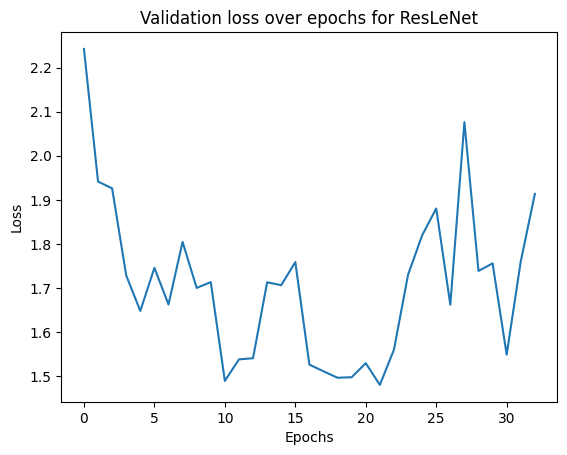

In [308]:
plot_training_behavior(resLeNet_trainingBehavior, model_name="ResLeNet")

In [309]:
print(f'Accuracy of the ResLeNet model on the test dataset: {round(model_metrics["ResLeNet"]["accuracy"]*100, 1)}%')

Accuracy of the ResLeNet model on the test dataset: 68.6%


In [310]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

#### Results:

With this final introduction, we have reached our fixed target.

### Comparisons Between Models

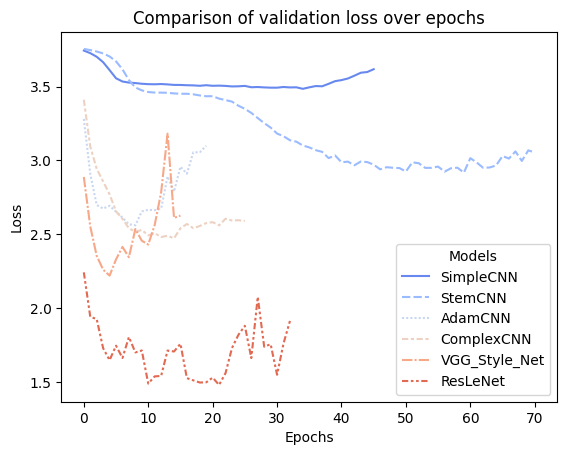

In [311]:
plot_all_training_behaviors(model_training_behavior)

       Model     Metric     Value
0  SimpleCNN   accuracy  0.155332
1  SimpleCNN  precision  0.017738
2  SimpleCNN     recall  0.044798
3  SimpleCNN   f1_score  0.024011
4    StemCNN   accuracy  0.295372


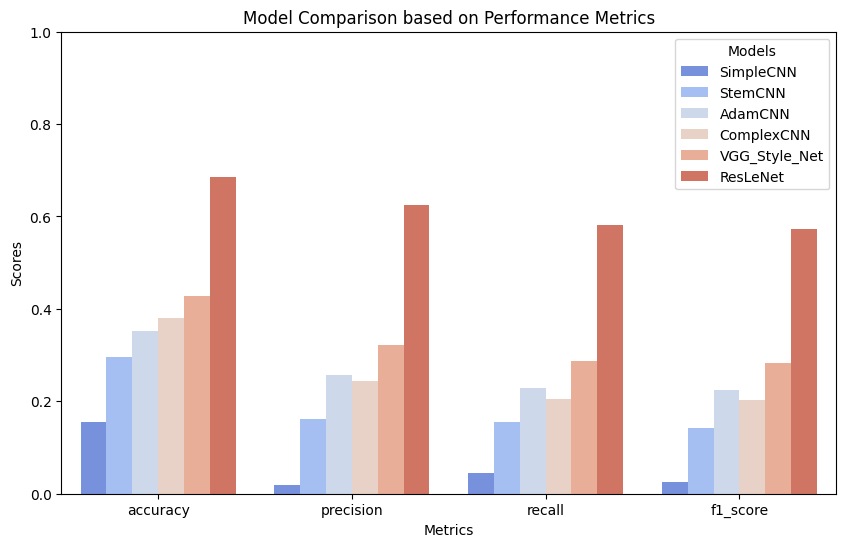

In [312]:
compare_metrics(model_metrics)

Through these graphs, we see that every improvement step can map to improvements in the classification task. We see that SimpleCNN is too shallow to produce accurate results, and more prone to overfitting due to its simplicity, while depth proves to be beneficial to the task. None of the deeper networks show overfitting tendencies. Moreover, the architectural choices inspired from the Imagenet Large-Scale Visual Recognition Challenge (ILSVRC) over the years (Max Pooling, Residual Connections, Global Average Pooling...), more than double metrics performance when compared with SimpleCNN and ComplexCNN, that are instead based on the single depth increase.

## Part 02

### CNN using Finetuned ResNet-18

The second part consists in finetuning the ResNet-18 model, pretrained on the dataset ImageNet-1K (V1). We keep the same hyperparameters, loss function and optimizer as the final model in the previous section as starter, with tweaks to match the new task of Transfer Learning. As we go on, we will improve on them.

In [172]:
model = resnet18(weights='IMAGENET1K_V1')

torch.manual_seed(42) # We reset the seed to 42

In [173]:
# We also reset some metrics so that we can perform some comparisons
finetune_metrics = {}
finetune_training_behavior = {}

### Step 01: Finetune only the classification head

To gain first insights on our starting point, we begin by fine-tuning our network by freezing the feature extractor and simply training the classification head.

In [174]:
# Freezing the feature extractor
for param in model.parameters():
    param.requires_grad = False

NUM_CLASSES = data.get_num_classes()

# modify the classification head of resnet to support our use case
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, NUM_CLASSES)

model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [175]:
# Starting hyperparameters

LEARNING_RATE = 1e-4
EPOCHS = 100
BATCH_SIZE = 16

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=LEARNING_RATE)

In [176]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

In [177]:
loaders = (train_dataloader, val_dataloader, test_dataloader)
baseline_frozenBehavior = train(loaders, loss_fn, optimizer, model, "ResNet-finetuned", batch_size=BATCH_SIZE, epochs=EPOCHS, force_train=True, early_stopping=10)
baseline_frozenLoss, baseline_frozenDict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

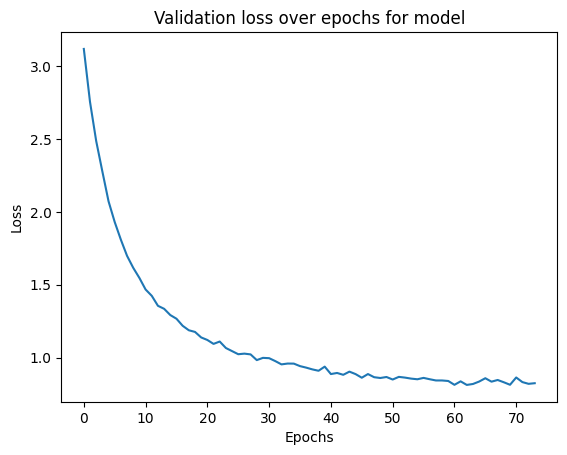

In [178]:
plot_training_behavior(baseline_frozenBehavior)

In [179]:
finetune_metrics['baseline_frozen'] = baseline_frozenDict
finetune_training_behavior['baseline_frozen'] = baseline_frozenBehavior

### Step 02: Unfreeze the Feature Extractor

After we trained the new classification head, we unfreeze the feature extraction and train the whole network, to see if we get better results

In [180]:
for param in model.parameters():
    param.requires_grad = True

# consequently, we re-initialize the optimizer to include all the trainable parameters
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [181]:
train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, pin_memory=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, pin_memory=True)

In [182]:
loaders = (train_dataloader, val_dataloader, test_dataloader)
baseline_fullBehavior = train(loaders, loss_fn, optimizer, model, "ResNet-finetuned_2step", batch_size=BATCH_SIZE, epochs=EPOCHS, force_train=True, early_stopping=10)
baseline_fullLoss, baseline_fullDict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

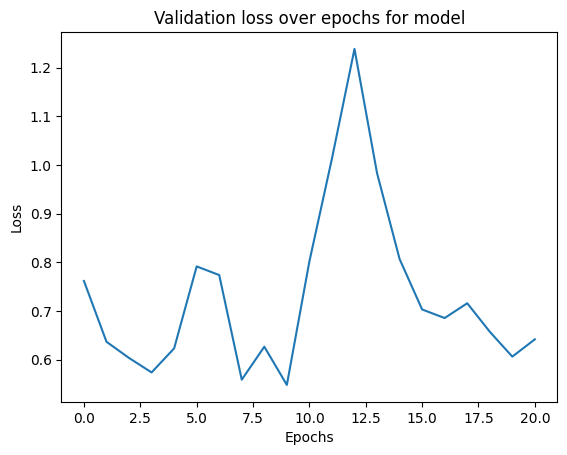

In [183]:
plot_training_behavior(baseline_fullBehavior)

In [184]:
finetune_metrics['baseline_2step'] = baseline_fullDict
finetune_training_behavior['baseline_2step'] = baseline_fullBehavior

In [185]:
del model
# cuda device doesn't free until garbage collection
if device == 'cuda':
    torch.cuda.empty_cache()

### Step 04: Repeat steps 01 and 02 with tweaked hyperparameters

We want to improve on the results we have obtained, as the hyperparameters we have used might be sub-optimal. To guide our search, we followed one of the ideas presented in this site: https://cs231n.github.io/transfer-learning/. The guide mentions how it's common to use smaller learning rates when fine-tuning pretrained CNNs, since we expect the weights to be relatively good and we don't want to distort them. As such, we opted to reduce the learning rate of one order of magnitude following some tests.

Furthermore, we decided to experiment with a larger batch size (32, instead of 16). The experiments shown in this blog [here](https://nikita.melkozerov.dev/posts/transfer-learning-batch-size-experiment/) show that 32 may be also the best batch size for finetuning a ResNet, as it leads to faster convergence while having a similar performance to other slower batch sizes.

In [ ]:
model = resnet18(weights='IMAGENET1K_V1')
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, NUM_CLASSES)
model.to(device)

LEARNING_RATE = 3e-5 
BATCH_SIZE = 32

optimizer = torch.optim.Adam(model.fc.parameters(), lr=LEARNING_RATE)
loaders = (train_dataloader, val_dataloader, test_dataloader)
loss_fn = nn.CrossEntropyLoss()
resTest_trainingBehavior = train(loaders, loss_fn, optimizer, model, "ResTest-finetuned", batch_size=BATCH_SIZE, epochs=EPOCHS, force_train=True, early_stopping=10)
resTest_loss, resTest_dict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

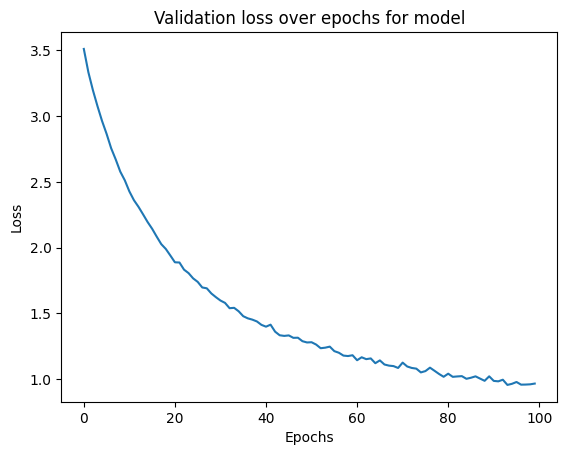

In [187]:
plot_training_behavior(resTest_trainingBehavior)

In [188]:
finetune_metrics['resTest_frozen'] = resTest_dict
finetune_training_behavior['resTest_frozen'] = resTest_trainingBehavior

In [189]:
for param in model.parameters():
    param.requires_grad = True

optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
loaders = (train_dataloader, val_dataloader, test_dataloader)
loss_fn = nn.CrossEntropyLoss()
resTest_2step_trainingBehavior = train(loaders, loss_fn, optimizer, model, "ResTest-finetuned-2step", batch_size=BATCH_SIZE, epochs=EPOCHS, force_train=True, early_stopping=10)
resTest_2step_loss, resTest_2step_dict = test_loop(test_dataloader, model, loss_fn, device)

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Training Batch:   0%|          | 0/165 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/19 [00:00<?, ?it/s]

Evaluate Batch:   0%|          | 0/156 [00:00<?, ?it/s]

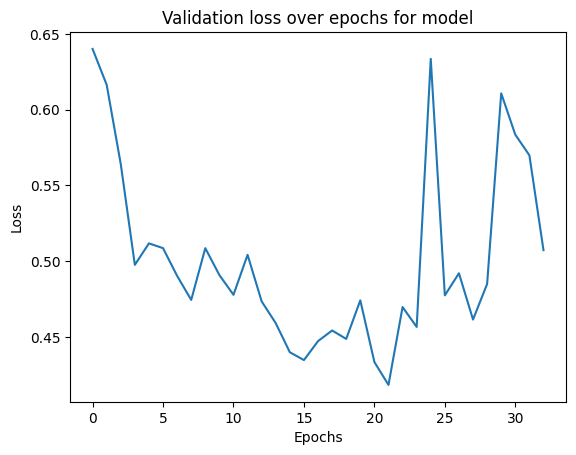

In [190]:
plot_training_behavior(resTest_2step_trainingBehavior)

In [191]:
finetune_metrics['resTest_2step'] = resTest_2step_dict
finetune_training_behavior['resTest_2step'] = resTest_2step_trainingBehavior

### Step 05: Metrics Comparison and Final Considerations

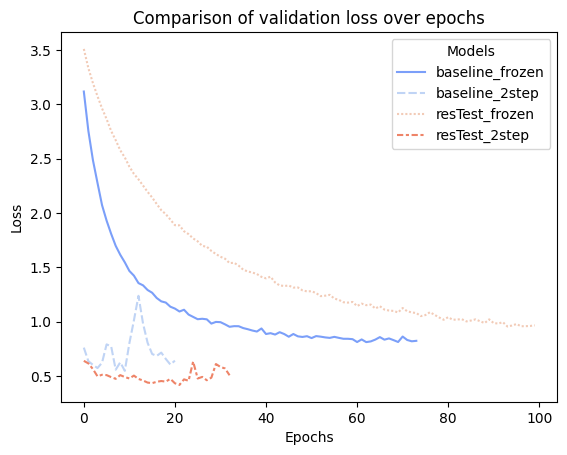

In [192]:
plot_all_training_behaviors(finetune_training_behavior)

             Model     Metric     Value
0  baseline_frozen   accuracy  0.760966
1  baseline_frozen  precision  0.748018
2  baseline_frozen     recall  0.659893
3  baseline_frozen   f1_score  0.679750
4   baseline_2step   accuracy  0.844266


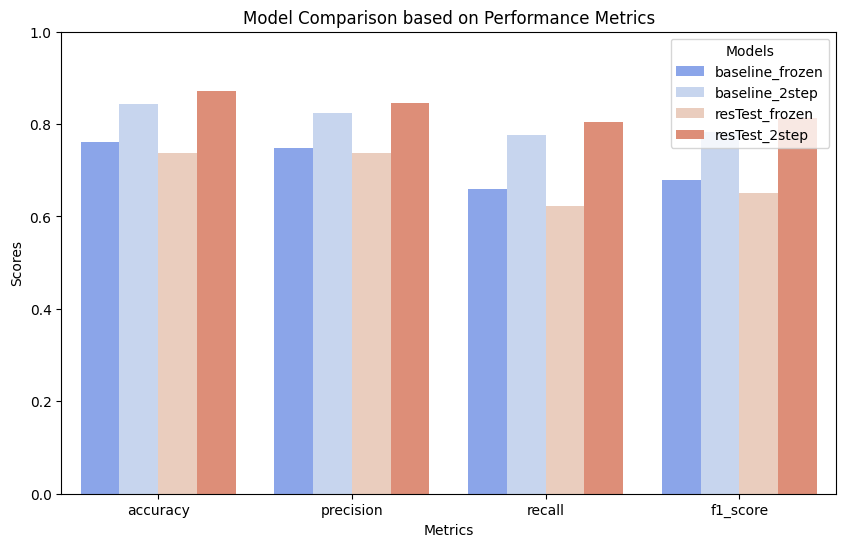

In [193]:
compare_metrics(finetune_metrics)

In [195]:
print(f"Final baseline accuracy: {finetune_metrics['baseline_2step']['accuracy']:.4f}")
print(f"Final ResTest accuracy: {finetune_metrics['resTest_2step']['accuracy']:.4f}")

Final baseline accuracy: 0.8443
Final ResTest accuracy: 0.8704


Graphs show an overall greater performance than Part 01, proving that using a pre-trained model for classification is indeed beneficial in our case study, compared to designing a network from scratch. Furthermore, we see the benefit in our two-step approach of first finetuning the head, then the entire network, as both the baseline and the "ResTest" improve sensibly with respect to their frozen counterparts.

While we extensively researched the literature available online to find the best hyperparameters for finetuning, we experimented with many techniques to reach the maximum potential of the dataset:
- We adopted a grid search algorithm to find the best learning rate and batch sizes. This strategy however lead to a substantial increase in training time considering our limited computational resources, while generally providing little to no benefits
- We adopted a cyclical learning rate schedule, in order to increase the learning rate in function of the number of schedules. Similarly, this lead to a small increase in performance, but it was too small to decide whether it was random noise or an actual improvement.
- We experimented with using a higher learning rates for the classification head and a smaller ones for the feature extractor, yet this resulted in model that performed worse than the baseline.